In [1]:
#data reading

import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.ticker as mticker


In [2]:
x = pd.read_csv('train_ver2.csv')

C:\Users\julian\AppData\Local\Temp\ipykernel_1788\1016150772.py:1: DtypeWarning: Columns (5,8,11,15) have mixed types. Specify dtype option on import or set low_memory=False.
  x = pd.read_csv('train_ver2.csv')


In [3]:
x['fecha_dato'] = pd.to_datetime(x['fecha_dato'])

In [4]:
#sort data
x = x.sort_values(by=['ncodpers', 'fecha_dato'])


In [5]:
#select about top 1000 customer
x = x[x['ncodpers'] < 43136]


In [6]:
#clean data
#preprocessing age
x['age'] = x['age'].replace(' NA', -1).apply(int)
#Gender preprocess
x['sexo'] = x['sexo'].replace('H', 'male').replace('V', 'female')
#customer seniority preprocessing (how long the customer be a customer)
x['antiguedad'] = x['antiguedad'].str.strip().replace('NA', -1).fillna(-1).apply(int)
anti_clean = x.groupby('ncodpers')['antiguedad'].max()
x['antiguedad'] = x.join(anti_clean, on = 'ncodpers', how='left', rsuffix='_clean')['antiguedad_clean']
#customer household income preprocessing
x['renta'] = x['renta'].fillna(-1).apply(int)
#active customer preprocessing
x['ind_actividad_cliente'] = x['ind_actividad_cliente'].fillna(0).apply(int)


In [7]:
#preprocess history product used and future product used
product_key = []
customer_key = []

for k in x.columns:
    if '_ult1' in k and 'ind_' in k:
        product_key.append(k)
        x[k] = x[k].astype(bool)    
    else:
        customer_key.append(k)

three_month_product = x[product_key].copy(deep=True)
#history_product = x[product_key].copy(deep=True)
for k in product_key:
    three_month_product[k] = False

customer_max_date = x.groupby('ncodpers').agg({'fecha_dato':max})
for i in range(3):
    past_month_product = x[product_key].copy(deep=True)
    past_month_product = past_month_product.shift(-i-1)
    reset_date = customer_max_date - pd.DateOffset(months=i)
    #past_month_product[['ncodpers', 'fecha_dato']] = x[['ncodpers', 'fecha_dato']]
    reset_index = pd.merge(x[['ncodpers', 'fecha_dato']].reset_index(), reset_date, how='inner', left_on=['ncodpers', 'fecha_dato'], right_on=['ncodpers', 'fecha_dato']).set_index('index')
    past_month_product[product_key][reset_index.index] = False
    past_month_product = past_month_product.fillna(False)
    three_month_product = three_month_product | past_month_product

history_product = x.groupby(['ncodpers'])[product_key].cumsum().astype(bool)


C:\Users\julian\AppData\Local\Temp\ipykernel_1788\1143113053.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  past_month_product[product_key][reset_index.index] = False
C:\Users\julian\AppData\Local\Temp\ipykernel_1788\1143113053.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  past_month_product[product_key][reset_index.index] = False
C:\Users\julian\AppData\Local\Temp\ipykernel_1788\1143113053.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, wh

In [46]:
customer_last_data = pd.merge(x.reset_index(), customer_max_date, how='inner', left_on=['ncodpers', 'fecha_dato'], right_on=['ncodpers', 'fecha_dato']).set_index('index')
customer_last_data = customer_last_data.join(history_product, how='inner', lsuffix='', rsuffix='_history')
customer_last_data = customer_last_data.join(three_month_product, how='inner', lsuffix='', rsuffix='_three_month')

In [ ]:
#data describe
#sex_cnt = x.groupby('sexo')['ncodpers'].nunique()
#age_cnt = x.groupby('age')['ncodpers'].nunique()
#employee_cnt = x.groupby('ind_empleado')['ncodpers'].nunique()
#residencia_cnt = x.groupby('pais_residencia').count()['ncodpers']
#antiguedad_cnt = x.groupby('antiguedad').count()['ncodpers']
#customer_income = x.groupby('ncodpers')['renta'].max()
#customer_income_dist = customer_income.groupby(pd.cut(customer_income, np.arange(0, 500000, 10000))).count()
#segmento_cnt = x.groupby('segmento').count()['ncodpers']
#active_cnt = x.groupby('ind_actividad_cliente').count()['ncodpers']

#product_cnt = {}
#for c in x.columns:
#    if 'fin_ult1' in c:
#        product_cnt[c] = x.groupby(c).count()['ncodpers']

In [59]:
import copy
history_product_key = copy.copy(product_key)
three_month_product_key = copy.copy(product_key)
for i in range(len(history_product_key)):
    history_product_key[i] = history_product_key[i] + '_history'
    three_month_product_key[i] = three_month_product_key[i] + '_three_month'

In [48]:
#aggregate statistic
age_cnt = customer_last_data.groupby('age')['ncodpers'].count()
sex_cnt = customer_last_data.groupby('sexo')['ncodpers'].count()
antiguedad_cnt = customer_last_data.groupby('antiguedad')['ncodpers'].count()
customer_income = customer_last_data.groupby('ncodpers')['renta'].max()
customer_income_dist = customer_income.groupby(pd.cut(customer_income, np.arange(0, 500000, 10000))).count()

(0.0, 120.0)

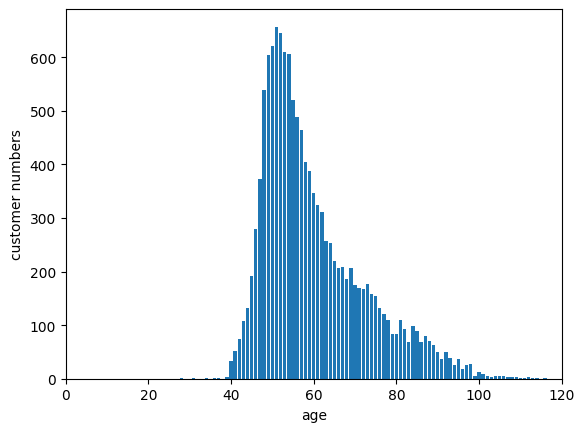

In [51]:
plt.bar(age_cnt.index, age_cnt)
plt.xlabel('age')
plt.ylabel('customer numbers')
plt.xlim([0, 120])


Text(0, 0.5, 'customer numbers')

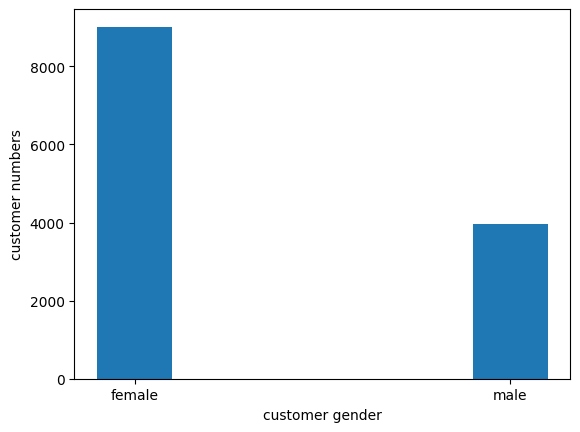

In [11]:
plt.bar(sex_cnt.index, sex_cnt,  width = 0.2)
plt.xlabel('customer gender')
plt.ylabel('customer numbers')

Text(0, 0.5, 'customer numbers')

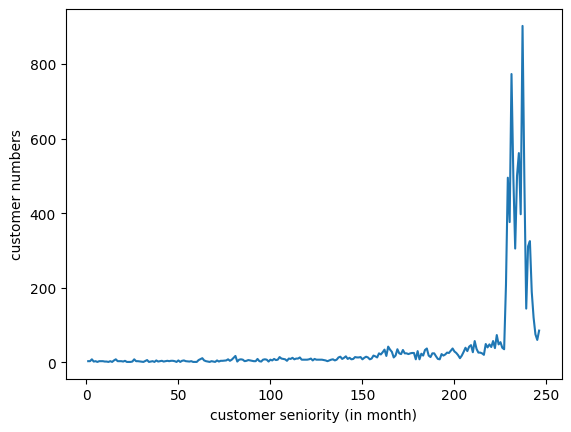

In [49]:
plt.plot(antiguedad_cnt[antiguedad_cnt.index>0])
plt.xlabel('customer seniority (in month)')
plt.ylabel('customer numbers')


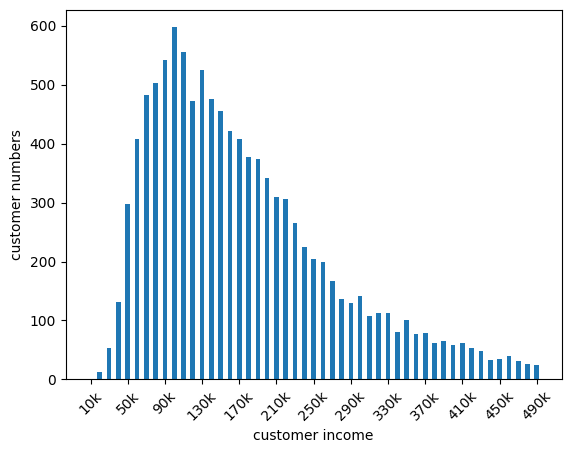

In [50]:
fig, ax = plt.subplots(1)

x_data = [str(i.right//1000)+'k' for i in customer_income_dist.index ]
myLocator = mticker.MultipleLocator(4)
y_data = customer_income_dist.to_list()
plt.bar(x_data, y_data, align='center', width=0.5)
plt.xlabel('customer income')
plt.ylabel('customer numbers')
ax.xaxis.set_major_locator(myLocator)
#axis_label = ax.set_xticklabels(x, rotation= 30)
axis_label = plt.xticks(rotation=45)


<AxesSubplot: >

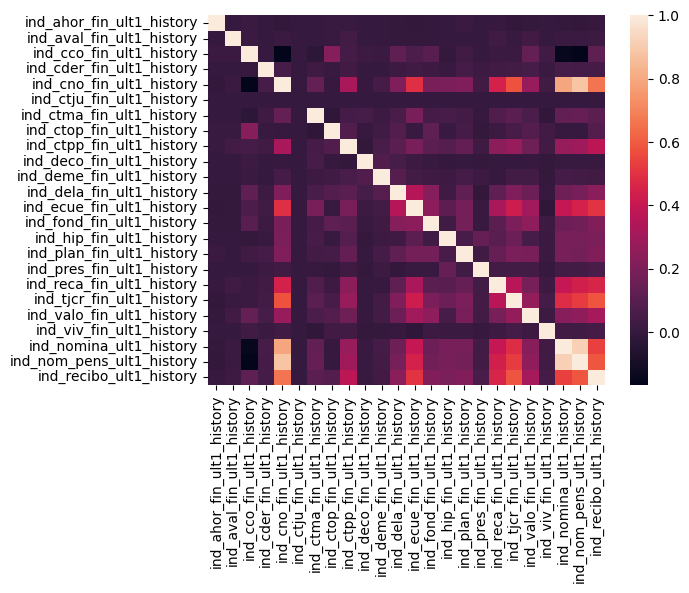

In [66]:
#history product correlation
import seaborn as sns 
hist_corr = customer_last_data[history_product_key].corr().fillna(0) #nan is all data is false
sns.heatmap(hist_corr)

C:\Users\julian\AppData\Local\Temp\ipykernel_1788\1485752541.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cust_corr = customer_last_data[customer_key].corr().fillna(0) #nan is all data is false


<AxesSubplot: >

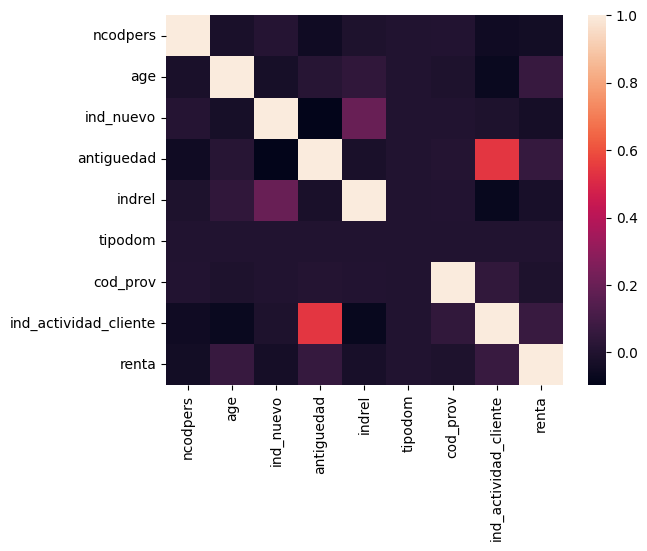

In [70]:
#customer data correlation
import seaborn as sns 
cust_corr = customer_last_data[customer_key].corr().fillna(0) #nan is all data is false
sns.heatmap(cust_corr)

In [16]:
product_used_ratio = product_use.sum() / len(product_use)
product_used_pie_data = {'other':0}
for product_name in product_used_ratio.index:
    ratio = product_used_ratio[product_name]
    cnt = product_use.sum()[product_name]
    if ratio < 0.05:
        product_used_pie_data['other'] += cnt
    else:
        if product_name in product_used_pie_data:
            product_used_pie_data[product_name.replace('ind_', '').replace('_fin_ult1', '')] += cnt 
        else:
            product_used_pie_data[product_name.replace('ind_', '').replace('_fin_ult1', '')] = cnt 
    



C:\Users\julian\AppData\Local\Temp\ipykernel_1788\1967651797.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis_data = axs[0].set_xticklabels(product_index, rotation= 30)


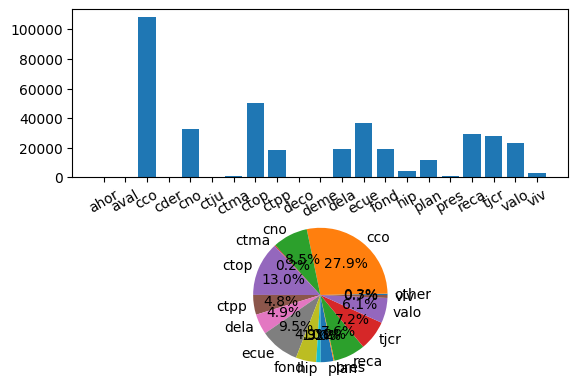

In [17]:
#plot how many people use the product 
fig, axs = plt.subplots(2)

product_index = [i.replace('ind_', '').replace('_fin_ult1', '') for i in product_use.sum().index]
axs[0].bar(product_index, product_use.sum())
t = axs[1].pie(product_used_pie_data.values(), labels=product_used_pie_data.keys(), autopct = "%1.1f%%")
axis_data = axs[0].set_xticklabels(product_index, rotation= 30)
#axis_data = plt.xticks(rotation=30)


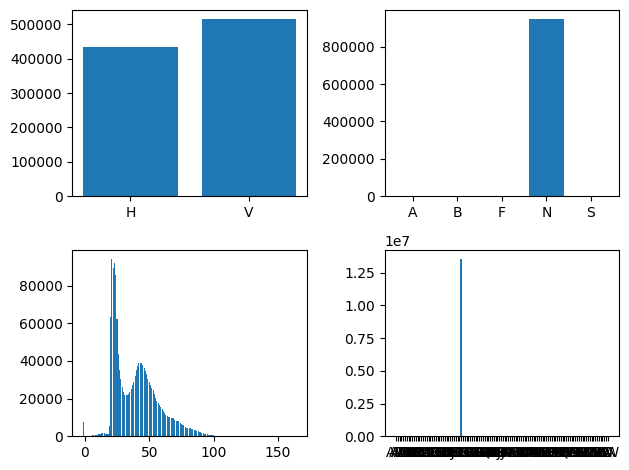

In [ ]:
fig, axs = plt.subplots(2,2)
axs[0][0].bar(sex_cnt.index, sex_cnt)
axs[1][0].bar(age_cnt.index, age_cnt)
axs[0][1].bar(employee_cnt.index, employee_cnt)
axs[1][1].bar(residencia_cnt.index, residencia_cnt)
fig.tight_layout()


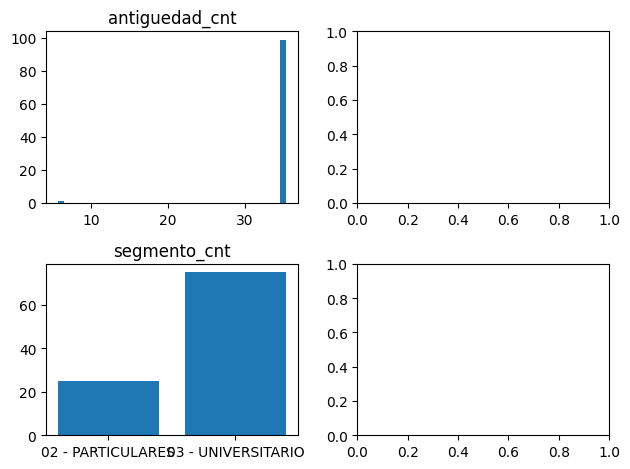

In [ ]:
fig, axs = plt.subplots(2,2)
axs[0][0].bar(antiguedad_cnt.index, antiguedad_cnt)
axs[0][0].set_title('antiguedad_cnt')

axs[1][0].bar(segmento_cnt.index, segmento_cnt)
axs[1][0].set_title('segmento_cnt')
fig.tight_layout()

#axs[0][1].bar(employee_cnt.index, employee_cnt)
#axs[1][1].bar(residencia_cnt.index, residencia_cnt)

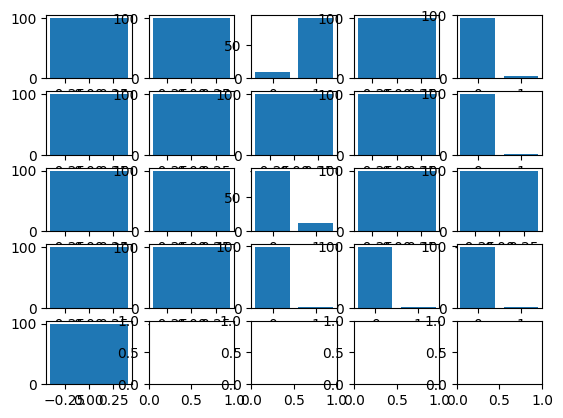

In [ ]:
#product cnt plot
import math 
product_num = len(product_cnt)
subplot_size = math.ceil(math.sqrt(len(product_cnt)))
subplot_width = math.ceil(product_num / subplot_size)
fig, axs = plt.subplots(subplot_size, subplot_width)
cnt = 0

for c in product_cnt:
    i = cnt // subplot_size
    j = cnt % subplot_width
    axs[i][j].bar(product_cnt[c].index, product_cnt[c])
    cnt += 1

In [ ]:
product_num

100